# Модуль 1. Парсинг и предобработка данных 

# 1.1 Парсинг данных

## Подключение необходимых библиотек

In [79]:
import pandas as pd
import numpy as np
import docx
import json
import glob
from bs4 import BeautifulSoup as bs
import requests
import os

## Получаем список кандидатов из данного docx-файла

In [80]:
doc = docx.Document('Condidates.docx')
condidates = []
for paragraph in doc.paragraphs:
    if(paragraph.text != ''):        
        txt = paragraph.text.strip()
        condidates.append(txt)
print(condidates)

['Здоровье.ру', 'Проект по использованию технологий компьютерного зрения на базе искусственного интеллекта (ИИ) для анализа медицинских изображений', 'skillbox', 'Gett', 'Промобот', 'Иннотех', 'Cybersport.Metaratings', 'MMA.Metaratings', 'Goose Gaming', 'ESforce Holding', 'Vinci Agency', 'Гэллэри Сервис', 'Студия Артемия Лебедева', 'Федерация креативных индустрий', 'Метарейтинг', 'СберМаркет', 'Balance Platform', 'Московская биржа', 'Samsung Electronics', 'Нетология', 'Дневник МЭШ', 'Цифровое образование']


## Получаем данные с json-файлов, данных в папке

In [81]:
result_list = {'name': [], 'description': [], 'rating': [], 'field': [], 'date': [], 'text': []}

path ="Data" 
filelist = []
json_list = []
for root, dirs, files in os.walk(path): 
    for file in files: 
        filelist.append(os.path.join(root,file))

for name1 in filelist:
    with open(name1, encoding="utf8") as json_data:
        data = json.load(json_data)
        search2 = os.path.relpath(name1, 'Data') 
        search2 = search2.replace('.json', '')
        json_list.append(search2)
        if (data['info'] == None):
            search = os.path.relpath(name1, 'Data') 
            search = search.replace('.json', '') 
            search = search.replace(' ', '%20')    
            url = 'https://habr.com/ru/companies/?q=' + search
            page = requests.get(url)
            soup = bs(page.text, 'html.parser')
            name = soup.find('em', class_= 'searched-item')
            description = soup.find('div', class_='tm-company-snippet__description')
            rating = soup.find('span', class_='tm-companies__score-counter tm-companies__score-counter_rating')
            field = soup.find('div', class_='tm-companies__company-hubs')
            if(name is not None):
                rating1 = rating.text.replace('Рейтинг', '')
                rating1 = rating1.replace(' ', '')
                rating1 = rating1.replace('\n', '')
                result_list['name'].append(name.text)
                result_list['description'].append(description.text)
                result_list['rating'].append(rating1)
                for i in data['refs']:                    
                    if((i[0]) is not None):                      
                        result_list['date'].append(i[1].get('day') + ' ' + i[1].get('month'))
                        result_list['text'].append(i[0])
            else:
                for i in data['refs']: 
                    if i is not None:
                        search1 = os.path.relpath(name1, 'Data') 
                        search1 = search.replace('.json', '')
                        search1 = search.replace('%20', ' ')
                        result_list['description'].append(None)
                        result_list['rating'].append(None)
                        result_list['field'].append(None)
                        result_list['name'].append(search1)
                        result_list['date'].append(i[1].get('day') + ' ' + i[1].get('month'))
                        result_list['text'].append(i[0])

        else:
            for i in data['refs']:
                search = os.path.relpath(name1, 'Data') 
                search = search.replace('.json', '') 
                industries = data['info'].get('industries')
                industries = str(industries)
                industries = industries.replace('[', '')
                industries = industries.replace(']', '')
                
                if((i[0]) is not None):
                    result_list['date'].append(i[1].get('day') + ' ' + i[1].get('month'))
                    result_list['text'].append(i[0])
                    result_list['name'].append(search)
                    result_list['description'].append(data['info'].get('about'))
                    result_list['rating'].append(data['info'].get('rate'))
                    result_list['field'].append(industries)

Результат прасинга с папки с json-файлами:

In [82]:
FILE_NAME = "habr_json.csv"
df = pd.DataFrame.from_dict(result_list, orient='index')
df.to_csv(FILE_NAME)
df = df.transpose()
pd.set_option('display.max_rows', 2000)
df.head(3000)

,name,description,rating,field,date,text
0,Cybersport.Metaratings,None,None,None,8 декабря,7 декабря состоялась церемония награждения лау...
1,ESforce Holding,None,None,None,8 декабря,7 декабря состоялась церемония награждения лау...
2,ESforce Holding,None,None,None,29 июля,Из совместного исследования издателя компьютер...
3,ESforce Holding,None,None,None,9 июля,По статистике The Esports Observer за I полови...
4,ESforce Holding,None,None,None,11 апреля,Компании SuperData Research и PayPal провели с...
5,Gett,None,None,None,29 марта,Минтранс предлагает новую версию законопроекта...
6,Gett,None,None,None,11 марта,"По информации «РИА Новости», агрегатор такси «..."
7,Gett,None,None,None,22 февраля,"Как сообщает издание Wired, с 1 марта 2022 год..."
8,Gett,None,None,None,21 февраля,Китайский агрегатор такси DiDi уйдет с российс...
9,Gett,None,None,None,7 февраля,"По информации издания «Известия», антимонополь..."


В данном случае, если мы не нашли информацию о компании в json-файле мы ищем эту информацию на сайте habr.com, если компании с данным именем уже не существует - заполняем пустыми значениями.

### Те компании, которые отсутсвуют в данной папке с json-файлами парсим с сайта habr.com

In [83]:
for cnd in condidates:
    if cnd not in json_list:
        search = cnd
        search = search.replace(' ', '%20')
        url = 'https://habr.com/ru/companies/?q=' + search
        page = requests.get(url)
        soup = bs(page.text, 'html.parser')
        name = soup.find('em', class_= 'searched-item')
        description = soup.find('div', class_='tm-company-snippet__description')
        rating = soup.find('span', class_='tm-companies__score-counter tm-companies__score-counter_rating')
        field = soup.find('div', class_='tm-companies__company-hubs')
        if (name is not None):
            rating1 = rating.text.replace('Рейтинг', '')
            rating1 = rating1.replace(' ', '')
            rating1 = rating1.replace('\n', '')
            
            href = soup.find('a', class_='tm-company-snippet__title')
            url = 'https://habr.com' + href.get('href')
            page = requests.get(url)
            soup = bs(page.text, 'html.parser')
            field_company = soup.find('div', class_='tm-company-profile__categories')
            field = field_company.text.replace('\n', '')
            
            url3 = 'https://habr.com/ru/search/?q=' + search + '&target_type=posts&order=relevance'
            page3 = requests.get(url3)
            soup3 = bs(page3.text, 'html.parser')
            

            a = 25
            g = 0
            for i in range(a):
                url4 = 'https://habr.com/ru/search/page' + str(i) + '/?q=' + search + '&target_type=posts&order=relevance'
                page4 = requests.get(url4)
                soup4 = bs(page4.text, 'html.parser')
                statie = soup4.find_all('a', class_ = 'tm-title__link')
                for j in statie:
                    href_ = soup.find('a', class_ = 'tm-title__link')
                    url2 = 'https://habr.com' + str(j.get('href'))
                    page2 = requests.get(url2)
                    soup2 = bs(page2.text, 'html.parser')
                    txt2 = soup2.find('div', class_='tm-article-body')
                    date2 = soup2.find('span', class_='tm-article-datetime-published')
                    if txt2 is not None:
                        result_list['name'].append(name.text)
                        result_list['description'].append(description.text)
                        result_list['rating'].append(rating1)
                        result_list['field'].append(field)
                        result_list['text'].append(txt2.text)
                        result_list['date'].append(date2.text)
                    

In [84]:
FILE_NAME = "habr_json.csv"
df = pd.DataFrame.from_dict(result_list, orient='index')
df.to_csv(FILE_NAME)
df = df.transpose()
pd.set_option('display.max_rows', 2000)
df.head(3000)

,name,description,rating,field,date,text
0,Cybersport.Metaratings,None,None,None,8 декабря,7 декабря состоялась церемония награждения лау...
1,ESforce Holding,None,None,None,8 декабря,7 декабря состоялась церемония награждения лау...
2,ESforce Holding,None,None,None,29 июля,Из совместного исследования издателя компьютер...
3,ESforce Holding,None,None,None,9 июля,По статистике The Esports Observer за I полови...
4,ESforce Holding,None,None,None,11 апреля,Компании SuperData Research и PayPal провели с...
5,Gett,None,None,None,29 марта,Минтранс предлагает новую версию законопроекта...
6,Gett,None,None,None,11 марта,"По информации «РИА Новости», агрегатор такси «..."
7,Gett,None,None,None,22 февраля,"Как сообщает издание Wired, с 1 марта 2022 год..."
8,Gett,None,None,None,21 февраля,Китайский агрегатор такси DiDi уйдет с российс...
9,Gett,None,None,None,7 февраля,"По информации издания «Известия», антимонополь..."


В итоге мы получили csv-файл с статьями с данных в папке json-файлов с данными о компаниях и их статьями, и статьями с данными о компаниях с сайта habr.com. Все компании были взяты из списка компаний в данном docx файле.

# 1.2 Формирование структуры набора данных

In [85]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1688 entries, 0 to 1687
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   name         1688 non-null   object
 1   description  869 non-null    object
 2   rating       869 non-null    object
 3   field        869 non-null    object
 4   date         1688 non-null   object
 5   text         1688 non-null   object
dtypes: object(6)
memory usage: 79.2+ KB


Изменим наш получившийся csv-файл.

Сразу оставим самые основные аттрибуты для дальнейшей работы: name, text. 
name - ключевой аттрибут для определения компании.
text - заключает в себе текст для обработки текстовых данных. 

Аттрибут field имеет информацию о 
направленной деятельности компании, но обрабатывать текст и векторизировать его для наших нужд не целесообразно, удалим его. 

Описание компании (description) имеет слишком много пропусков и мало данных внутри для проведения дополнительной обработки текстовых данных, удалим его. 

Аттрибуты ratind и date оставим для дальнейшей визуализации зависимостей и важности переменной для обучения.

Данных данных нам вполне хватит для проведения всех дальнейших манипуляций и обучения

In [86]:
df = df.drop(['description'], axis = 1)
df = df.drop(['field'], axis = 1)

# 1.3 Предварительная обработка текстовых данных

In [87]:
import string
import nltk
from nltk.corpus import stopwords
stopwords = nltk.corpus.stopwords.words('russian')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
import re
from pandas_profiling import ProfileReport

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\МОиБД\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\МОиБД\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


### Выполним разведочный анализ:

In [88]:
pr = ProfileReport(df)
pr

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [89]:
date_list = []

for i in df['date']:
    check = True
    if 'янв' in i:
        date_list.append('январь')
        check = False
    if 'фев' in i:
        date_list.append('февраль')
        check = False
    if 'мар' in i:
        date_list.append('март')
        check = False
    if 'апр' in i:
        date_list.append('апрель')
        check = False
    if 'май' in i:
        date_list.append('май')
        check = False
    if 'мая' in i:
        date_list.append('май')
        check = False
    if 'июн' in i:
        date_list.append('июнь')
        check = False
    if 'июл' in i:
        date_list.append('июль')
        check = False
    if 'авг' in i:
        date_list.append('август')
        check = False
    if 'сен' in i:
        date_list.append('сентябрь')
        check = False
    if 'окт' in i:
        date_list.append('октябрь')
        check = False
    if 'ноя' in i:
        date_list.append('ноябрь')
        check = False
    if 'дек' in i:
        date_list.append('декабрь')
        check = False
    if(check == True):
        date_list.append('месяц')
    
df['date'] = date_list
df.head(1000)

,name,rating,date,text
0,Cybersport.Metaratings,None,декабрь,7 декабря состоялась церемония награждения лау...
1,ESforce Holding,None,декабрь,7 декабря состоялась церемония награждения лау...
2,ESforce Holding,None,июль,Из совместного исследования издателя компьютер...
3,ESforce Holding,None,июль,По статистике The Esports Observer за I полови...
4,ESforce Holding,None,апрель,Компании SuperData Research и PayPal провели с...
5,Gett,None,март,Минтранс предлагает новую версию законопроекта...
6,Gett,None,март,"По информации «РИА Новости», агрегатор такси «..."
7,Gett,None,февраль,"Как сообщает издание Wired, с 1 марта 2022 год..."
8,Gett,None,февраль,Китайский агрегатор такси DiDi уйдет с российс...
9,Gett,None,февраль,"По информации издания «Известия», антимонополь..."


### Выполним текстовую обработку:

In [90]:
def remove_punctuation(text):
    return ''.join([ch for ch in text if ch not in string.punctuation]) # метод для удаления пунктуации

In [91]:
def remove_numbers(text):
    return ''.join([i if not i.isdigit() else ' ' for i in text]) # метод для удаления чисел

In [92]:
def remove_notalpha(text):
    return ''.join([i if i.isalpha() else ' ' for i in text]) # метод для проверки на только алфавитные символы

In [93]:
import re
def remove_space(text):
    return re.sub(r'\s+',' ', text, flags=re.I) # метод для удаления пробелов

In [94]:
def remove_latin(text):
    return re.sub('[a-z]','', text, flags=re.I) # метод для удаления символов латинского алфавит

In [95]:
st = '❯\0'

In [96]:
def remove_othersymbol(text):
    return ''.join([ch if ch not in st else ' ' for ch in text]) # удаление остальных не нужных символов

In [97]:
def remove_stopwords(text):
    return [word for word in text if word not in stopwords] # удаление стоп-слов

In [98]:
def tokenize(text):
    t = word_tokenize(text)
    return [token for token in t if token not in stopwords] # метод для токенизации

In [99]:
def part_speech(text):
#     t = word_tokenize(text)
    return nltk.pos_tag(text) # метод для проверки частей речи

In [100]:
pip install pymorphy2

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [101]:
from nltk.stem import WordNetLemmatizer
import nltk
nltk.download('wordnet')
import pymorphy2
nltk.download('punkt')
morph = pymorphy2.MorphAnalyzer()


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\МОиБД\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\МОиБД\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [102]:
wn = nltk.WordNetLemmatizer()
def lemmatize(text):
    res = list()
    for word in text:
        p = morph.parse(word)[0]
        res.append(p.normal_form)

    return res # метод для леммитизации

Для проведения всех вышеперечисленных операций обработки текста мы использовали специализированные библиотеки, как например специальный пакет nltk и его возможностями для токенизации в частности, заместо, например, стандартного метода split() не так хорошо отвечающего главной цели токенизации. То же и с лимматизацией при помощи nltk и встроенной библиотеки re для удаления лишних символов. Таким образом специализрованные библиотеки лучше справялются с задачей, а иногда и вовсе отсаются единстенным способом. Конечно, это не единственные библиотеки, так для лимматизации сущеюсвтуют ещё и TextBlob и GensinLemmatizer и др. однако в случае положительного результата всех библиотек выбор может быть любым.

In [103]:
text_list = []

#### Обработам наши текстовые данные: удалим пунктуацию, числа, проверим на только алфавитные символы, удалим пробелы, символы латинского алфавита, а так же другие не нужные нам символы. Проведём токенизацию и лимматизацию, удалим стоп-слова

In [104]:
g = 0
for i in df['text']:
    if i is not None:
        i = remove_punctuation(i)
        i = remove_numbers(i)
        i = remove_notalpha(i)
        i = remove_space(i)
        i = remove_latin(i)
        i = remove_othersymbol(i)
        i = tokenize(i)
        i = remove_stopwords(i)
        i = lemmatize(i)
        text_list.append(i)

Посмотрим на пример результата обработки текста:

In [105]:
print(text_list[0])

['декабрь', 'состояться', 'церемония', 'награждение', 'лауреат', 'премия', 'рунет', 'год', 'в', 'год', 'премия', 'подать', 'работа', 'вклад', 'развитие', 'российский', 'сегмент', 'сеть', 'интернет', 'девять', 'основный', 'четыре', 'специальный', 'номинация', 'финалист', 'конкурс', 'каждый', 'номинация', 'стать', 'организация', 'лауреат', 'премия', 'рунет', 'стать', 'компания', 'персона', 'причём', 'ранний', 'организатор', 'российский', 'ассоциация', 'электронный', 'коммуникация', 'раэк', 'награждать', 'несколько', 'хороший', 'представитель', 'каждый', 'номинация', 'мнение', 'экспертный', 'сообщество', 'в', 'год', 'обратиться', 'помощь', 'искусственный', 'интеллект', 'добавить', 'один', 'лауреат', 'который', 'выбираться', 'именно', 'мнение', 'ия', 'номинация', 'государство', 'общество', 'победитель', 'благотворительный', 'фонд', 'подарить', 'жизнь', 'ано', 'диалог', 'правительство', 'москва', 'проект', 'цифровой', 'экосистема', 'москва', 'фнс', 'россия', 'программа', 'пушкинский', 'карт

In [156]:
df['text_lemtize'] = text_list

In [106]:
part_speech_list = []

### Проанализируем значимые части речи

Посмотрим на пример результата:

In [107]:
def part(text):
    res = list()
    for word in text:
        p = morph.parse(word)[0]
        a = (word, p.tag.cyr_repr)
        res.append(tuple(a))
    return res # метод для выделения значимых частей речи

In [108]:
prep_txt_list = []

In [109]:
for txt in text_list:
    prep_txt = part(txt)
    prep_txt_list.append(prep_txt)

Посмотрим на примере результат работы анализа значимых частей речи:

In [110]:
print(prep_txt_list[2])

[('из', 'ПР'), ('совместный', 'ПРИЛ,кач неод,мр,ед,вн'), ('исследование', 'СУЩ,неод,ср ед,им'), ('издатель', 'СУЩ,од,мр ед,им'), ('компьютерный', 'ПРИЛ мр,ед,им'), ('игра', 'СУЩ,неод,жр ед,им'), ('компания', 'СУЩ,неод,жр ед,им'), ('стать', 'ИНФ,сов,неперех'), ('известно', 'ПРЕДК,наст'), ('сам', 'ПРИЛ,мест-п мр,ед,им'), ('популярный', 'ПРИЛ,кач мр,ед,им'), ('игра', 'СУЩ,неод,жр ед,им'), ('среди', 'ПР'), ('россиянин', 'СУЩ,од,мр ед,им'), ('возраст', 'СУЩ,неод,мр ед,им'), ('год', 'СУЩ,неод,мр ед,вн'), ('являться', 'ИНФ,несов,неперех'), ('проголосовать', 'ИНФ,сов,перех'), ('опросить', 'ИНФ,сов,перех'), ('тройка', 'СУЩ,неод,жр ед,им'), ('замыкать', 'ИНФ,несов,перех'), ('франшиза', 'СУЩ,неод,жр ед,им'), ('игра', 'СУЩ,неод,жр ед,им'), ('результат', 'СУЩ,неод,мр ед,им'), ('глобальный', 'ПРИЛ,кач мр,ед,им'), ('голосование', 'СУЩ,неод,ср ед,им'), ('отличаться', 'ИНФ,несов,неперех'), ('российскогосписка', 'СУЩ,неод,жр ед,им'), ('франшиза', 'СУЩ,неод,жр ед,им'), ('продолжать', 'ИНФ,несов,перех'), 

Алгоритм выделил значимые части речи для каждого нашего слова

# 1.4 Поиск ключевых слов/n-грамм. Векторизация текстов

### Выполним поиск ключевых слов/биграмм/триграмм в тексте 


In [111]:
import nltk
from nltk.tokenize import word_tokenize
from collections import Counter
from nltk.util import ngrams
import statistics
from statistics import mode
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder
from nltk.collocations import TrigramAssocMeasures, TrigramCollocationFinder

In [112]:
new_list = []

In [113]:
for i in text_list:
    txt = ' '.join(i)
    new_list.append(txt)
new_list = np.array(new_list)

In [114]:
import yake

kw_extractor1 = yake.KeywordExtractor(lan='ru', top=20, n=1, dedupLim=0.9)
keywords1 = kw_extractor1.extract_keywords(new_list[0])

kw_extractor2 = yake.KeywordExtractor(lan='ru', top=20, n=2, dedupLim=0.9)
keywords2 = kw_extractor2.extract_keywords(new_list[0])

kw_extractor3 = yake.KeywordExtractor(lan='ru', top=20, n=3, dedupLim=0.9)
keywords3 = kw_extractor3.extract_keywords(new_list[0])


Для определения униграмм, биграмм и триграмм будем использовать модуь yake, для вышеперислыенных действий на него треубется меньше всего строчек кода, что не может обеспечить, например ltk-пакет

In [115]:
for kw in keywords1:
    print(kw)

('номинация', 0.005064963367694449)
('проект', 0.005740117602240556)
('москва', 0.006857153207141748)
('премия', 0.009597483666723637)
('рунет', 0.010276925143637802)
('развитие', 0.012424141339720998)
('лауреат', 0.014636269423686697)
('правительство', 0.01682022072456201)
('индустрия', 0.01682022072456201)
('туризм', 0.019300018698043278)
('креативный', 0.020454258425968694)
('город', 0.022150791781882836)
('конкурс', 0.02569991871539923)
('стать', 0.02569991871539923)
('коммуникация', 0.02569991871539923)
('цифровой', 0.02569991871539923)
('россия', 0.02569991871539923)
('московский', 0.02569991871539923)
('ооо', 0.02569991871539923)
('федеральный', 0.02569991871539923)


In [116]:
for kw in keywords2:
    print(kw)

('премия рунет', 0.0007126854579669141)
('москва проект', 0.0011864298434728858)
('город москва', 0.0012195768200043051)
('правительство москва', 0.0012348384528558724)
('креативный индустрия', 0.0013818857388224047)
('лауреат премия', 0.0021159874197446043)
('искусственный интеллект', 0.0026097394251511554)
('вклад развитие', 0.0027002867786028823)
('номинация креативный', 0.003127442283528896)
('москва московский', 0.004247443191619674)
('экосистема москва', 0.004432409016867105)
('москва фнс', 0.004432409016867105)
('гостеприимство москва', 0.004432409016867105)
('москва туристический', 0.004432409016867105)
('москва вдобавок', 0.004432409016867105)
('премия подать', 0.004653828213355305)
('голосование премия', 0.004653828213355305)
('награда премия', 0.004653828213355305)
('участие премия', 0.004653828213355305)
('рунет стать', 0.004776799874112528)


In [117]:
for kw in keywords3:
    print(kw)

('правительство москва проект', 0.00010738675942712885)
('лауреат премия рунет', 0.00013147102106638963)
('номинация креативный индустрия', 0.00021257918507277965)
('премия рунет стать', 0.00027714419836357486)
('город москва московский', 0.0002845982325189357)
('туризм город москва', 0.0002849718392259742)
('голосование премия рунет', 0.00028926967220706165)
('премия рунет выбрать', 0.00028926967220706165)
('награда премия рунет', 0.00028926967220706165)
('премия рунет получить', 0.00028926967220706165)
('участие премия рунет', 0.00028926967220706165)
('спорт город москва', 0.00029705174367664945)
('город москва вдобавок', 0.00029705174367664945)
('диалог правительство москва', 0.0003007872195511944)
('кадр правительство москва', 0.0003007872195511944)
('город москва проект', 0.0003181580019640551)
('креативный индустрия ооо', 0.00032263621210133997)
('креативный индустрия ассоциация', 0.00032627525690953217)
('федерация креативный индустрия', 0.0003262752569095322)
('организация лаур

### Представим наш документ в виде униграмм/биграмм и триграмм и преобразуем его в векторные представления различными способами

#### Сделаем при помощи CountVectorizer

#### В результате выполнения c CountVectorizer мы получим матрицы с количеством вхождений слов в каждом тексте 

In [118]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(analyzer='word', ngram_range=(1, 3), min_df=2)

ngram_range=(1,3) - Здесь (и в последующих использованиях) означает, что для построения объектов будут учитываться как униграммы, биграммы и триграммы

In [119]:
cv_matrix = cv.fit_transform(new_list)
cv_matrix = cv_matrix.toarray()

#### Полученная матрица:

In [120]:
cv_matrix

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [121]:
for i in cv_matrix[99]:
    print(i)

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


#### Сделаем при помощи TfidfVectorizer

#### с TfidfVectorizer мы получим матрицу весов 

In [122]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [123]:
tfidf = TfidfVectorizer(analyzer='word', ngram_range=(1, 3), min_df=2)
tfidf_matrix = tfidf.fit_transform(new_list)
tfidf_matrix = tfidf_matrix.toarray()

Посмотрим на наши униграммы/биграммы/триграммы в виде слов:

In [124]:
tfidf.get_feature_names_out()

array(['éé', 'аа', 'аа понятно', ..., 'ёмкость часовой',
       'ёмкость часовой разряд', 'ёрзать'], dtype=object)

In [125]:
tfidf_matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [126]:
for i in tfidf_matrix[99]:
    print(i)

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.025288718738390833
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.05111054735166517
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.04758950598845207
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


Получили числовые тензоры методом TfidfVectorizer

#### Сделаем при помощи HashingVectorizer

####  В отличие от CountVectorizer и TfidfVectorizer HashingVectorizer использует хэш слов, что решает проблему огромного словарного запаса.

In [127]:
from sklearn.feature_extraction.text import HashingVectorizer

In [128]:
vectorizer = HashingVectorizer(n_features=20)
vector = vectorizer.transform(new_list)

In [129]:
vector = vector.toarray()

In [130]:
for i in vector:
    print(i)

[-0.14686837  0.2349894   0.          0.05874735  0.1174947   0.20561572
 -0.05874735 -0.2349894  -0.2349894   0.05874735 -0.20561572 -0.17624205
  0.1174947   0.         -0.61684717 -0.08812102  0.05874735  0.44060512
 -0.17624205  0.20561572]
[-0.14686837  0.2349894   0.          0.05874735  0.1174947   0.20561572
 -0.05874735 -0.2349894  -0.2349894   0.05874735 -0.20561572 -0.17624205
  0.1174947   0.         -0.61684717 -0.08812102  0.05874735  0.44060512
 -0.17624205  0.20561572]
[-0.36989772 -0.36989772 -0.20549873  0.         -0.28769823  0.32879797
 -0.12329924  0.12329924  0.16439899 -0.49319696  0.         -0.12329924
 -0.12329924  0.04109975 -0.12329924  0.32879797 -0.16439899  0.08219949
  0.04109975  0.04109975]
[-0.33776026  0.08444007 -0.21110017 -0.1266601  -0.16888013  0.
  0.33776026  0.08444007  0.3799803  -0.21110017  0.04222003 -0.3799803
 -0.08444007  0.54886043  0.          0.04222003 -0.08444007 -0.04222003
 -0.08444007  0.08444007]
[-0.48428059 -0.12107015 -0.0

In [131]:
hashing_list = []
for i in vector:
    hashing_list.append(i)

#### Добавим наши униграммы/биграммы/триграммы в наш набор данных в векторизированном виде при помощи библиотеки HashingVectorizer

In [132]:
df['Vector'] = hashing_list

In [133]:
df.head()

,name,rating,date,text,Vector
0,Cybersport.Metaratings,None,декабрь,7 декабря состоялась церемония награждения лау...,"[-0.14686837386151166, 0.23498939817841866, 0...."
1,ESforce Holding,None,декабрь,7 декабря состоялась церемония награждения лау...,"[-0.14686837386151166, 0.23498939817841866, 0...."
2,ESforce Holding,None,июль,Из совместного исследования издателя компьютер...,"[-0.3698977214370539, -0.3698977214370539, -0...."
3,ESforce Holding,None,июль,По статистике The Esports Observer за I полови...,"[-0.33776026473659926, 0.08444006618414981, -0..."
4,ESforce Holding,None,апрель,Компании SuperData Research и PayPal провели с...,"[-0.48428058736275703, -0.12107014684068926, -..."


# 1.5 Разведочный анализ

#### Дополним наш набор данных целевой переменной 

In [134]:
nominations_list = []
with open("Target.json", 'r', encoding='utf8') as json_data:
    data = json.load(json_data)
    g = 0
    for i in df['name']:
         for j in data['name']:
            if(i == j['Сompany']):
                 nominations_list.append(j['Nominations'])
df['nominations'] = nominations_list
df.head(2000)

,name,rating,date,text,Vector,nominations
0,Cybersport.Metaratings,None,декабрь,7 декабря состоялась церемония награждения лау...,"[-0.14686837386151166, 0.23498939817841866, 0....",Игровая индустрия и киберспорт
1,ESforce Holding,None,декабрь,7 декабря состоялась церемония награждения лау...,"[-0.14686837386151166, 0.23498939817841866, 0....",Игровая индустрия и киберспорт
2,ESforce Holding,None,июль,Из совместного исследования издателя компьютер...,"[-0.3698977214370539, -0.3698977214370539, -0....",Игровая индустрия и киберспорт
3,ESforce Holding,None,июль,По статистике The Esports Observer за I полови...,"[-0.33776026473659926, 0.08444006618414981, -0...",Игровая индустрия и киберспорт
4,ESforce Holding,None,апрель,Компании SuperData Research и PayPal провели с...,"[-0.48428058736275703, -0.12107014684068926, -...",Игровая индустрия и киберспорт
5,Gett,None,март,Минтранс предлагает новую версию законопроекта...,"[-0.052414241836095915, -0.10482848367219183, ...","Наука, технологии и инновации"
6,Gett,None,март,"По информации «РИА Новости», агрегатор такси «...","[0.14471492105848432, -0.36178730264621084, -0...","Наука, технологии и инновации"
7,Gett,None,февраль,"Как сообщает издание Wired, с 1 марта 2022 год...","[-0.5447347107028433, -0.27236735535142165, -0...","Наука, технологии и инновации"
8,Gett,None,февраль,Китайский агрегатор такси DiDi уйдет с российс...,"[-0.21107926341908756, 0.07035975447302918, 0....","Наука, технологии и инновации"
9,Gett,None,февраль,"По информации издания «Известия», антимонополь...","[0.0, 0.10050378152592121, -0.3517632353407242...","Наука, технологии и инновации"


#### преобразуем категориальный признак в числовой 

In [135]:
df['nominations'] = pd.factorize(df['nominations'])[0]

In [136]:
df.head(1000)

,name,rating,date,text,Vector,nominations
0,Cybersport.Metaratings,None,декабрь,7 декабря состоялась церемония награждения лау...,"[-0.14686837386151166, 0.23498939817841866, 0....",0
1,ESforce Holding,None,декабрь,7 декабря состоялась церемония награждения лау...,"[-0.14686837386151166, 0.23498939817841866, 0....",0
2,ESforce Holding,None,июль,Из совместного исследования издателя компьютер...,"[-0.3698977214370539, -0.3698977214370539, -0....",0
3,ESforce Holding,None,июль,По статистике The Esports Observer за I полови...,"[-0.33776026473659926, 0.08444006618414981, -0...",0
4,ESforce Holding,None,апрель,Компании SuperData Research и PayPal провели с...,"[-0.48428058736275703, -0.12107014684068926, -...",0
5,Gett,None,март,Минтранс предлагает новую версию законопроекта...,"[-0.052414241836095915, -0.10482848367219183, ...",1
6,Gett,None,март,"По информации «РИА Новости», агрегатор такси «...","[0.14471492105848432, -0.36178730264621084, -0...",1
7,Gett,None,февраль,"Как сообщает издание Wired, с 1 марта 2022 год...","[-0.5447347107028433, -0.27236735535142165, -0...",1
8,Gett,None,февраль,Китайский агрегатор такси DiDi уйдет с российс...,"[-0.21107926341908756, 0.07035975447302918, 0....",1
9,Gett,None,февраль,"По информации издания «Известия», антимонополь...","[0.0, 0.10050378152592121, -0.3517632353407242...",1


#### Проведём анализ нормальности распределения целевой переменной

In [137]:
import seaborn as sns
%matplotlib inline
import numpy as np 
import pylab
import scipy.stats as stats
from scipy.stats import shapiro

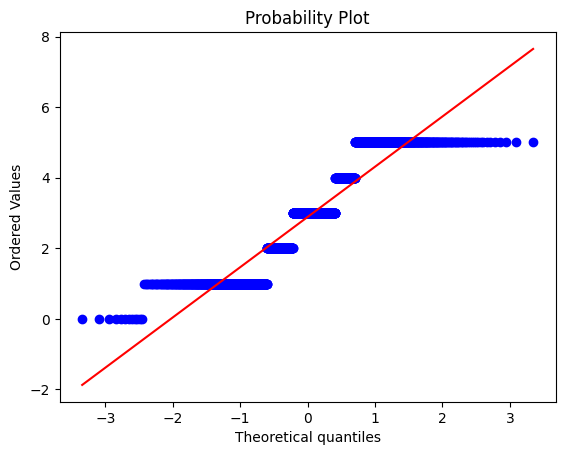

In [138]:
normal_df = df['nominations']
stats.probplot(normal_df, dist="norm", plot=pylab)
pylab.show()

Переменная не имеет нормальной плотности распределения, далеко не все точки расположены на прямой линии

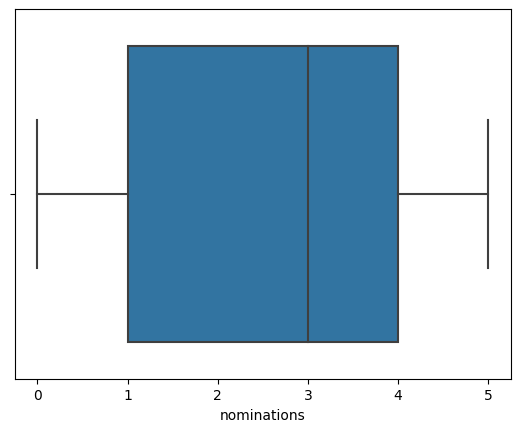

In [139]:
graph2 = sns.boxplot(x=normal_df)

Переменная не имеет нормальной плотности распределения, медиана находится не строго по центру

In [140]:
stat, p= shapiro(normal_df)
print('stat=%.3f, p=%.3f'% (stat, p))
if p > 0.05:
    print('Гауссовское распределение')
else:
    print('Не гауссовское распределение')

stat=0.870, p=0.000
Не гауссовское распределение


В результате анализа распределения целевой переменной (графического и статистического) мы сделали вывод о не нормальной 

плотности распределения целевой переменной

#### Посмотрим на зависимость целевой переменной от времени:

<AxesSubplot: xlabel='nominations', ylabel='count'>

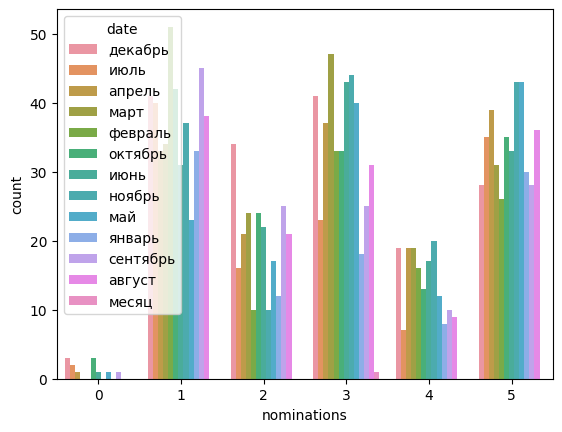

In [141]:
sns.countplot(x=df["nominations"], hue=df['date'])

На графике видно количество публикаций в том или ином месяце в разных номинациях, где цвет это какой-либо месяц.

#### Посмотрим на статистику публикаций:

<AxesSubplot: xlabel='nominations', ylabel='count'>

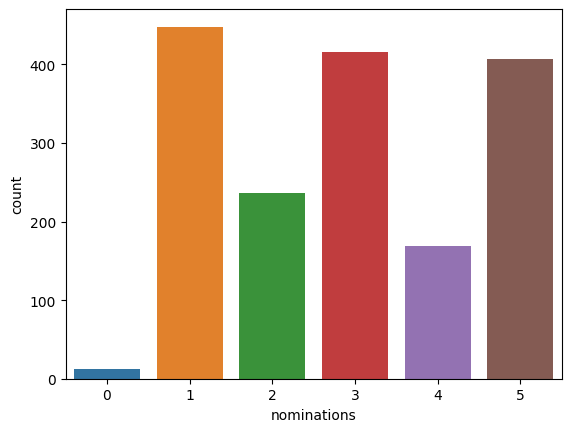

In [142]:
sns.countplot(x=df["nominations"])

На графике видно количество публикаций с той или иной номинацией

In [143]:
list_keyWords = tfidf.inverse_transform(vector)

In [144]:
df['keyWords'] = list_keyWords

#### Посмотрим на зависимость целевой переменной от рейтинга  компании:

<AxesSubplot: xlabel='nominations', ylabel='count'>

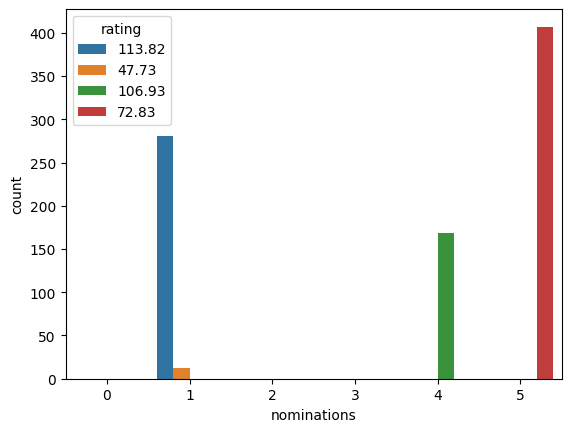

In [145]:
sns.countplot(x=df["nominations"], hue=df['rating'])

На графике видно количество статей по определённым номинациям с разбиением с учётом рейтинга компании, где рейтинг зависит от цвета.

#### Посмотрим на зависимость целевой переменной от ключевых слов

<AxesSubplot: xlabel='keyWords'>

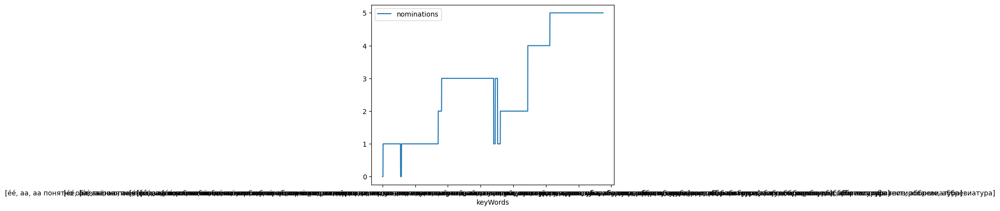

In [146]:
df.plot(x="keyWords", y="nominations")

#### Удалим уже не нужные нам столбцы text

In [147]:
df['date'] = pd.factorize(df['date'])[0]

In [148]:
df['name'] = pd.factorize(df['name'])[0]

In [149]:
df = df.drop(['text'], axis = 1)

In [150]:
df = df.drop(['keyWords'], axis = 1)

In [151]:
df.head()

,name,rating,date,Vector,nominations
0,0,None,0,"[-0.14686837386151166, 0.23498939817841866, 0....",0
1,1,None,0,"[-0.14686837386151166, 0.23498939817841866, 0....",0
2,1,None,1,"[-0.3698977214370539, -0.3698977214370539, -0....",0
3,1,None,1,"[-0.33776026473659926, 0.08444006618414981, -0...",0
4,1,None,2,"[-0.48428058736275703, -0.12107014684068926, -...",0


In [157]:
df.to_csv(FILE_NAME)
df.to_pickle('habr.pickle')

# 1.6 Подготовка отчета

### 1.1 Парсинг и предобработка данных

Здесь были загружены все необходимые файлы в datadrame с json-файлов и с сайта habr.com те компании, которые находились в списке кандидатов, но не нашлись в списке json-файлов. Не все компании в списке кандидатов сущесвтуют где-либо. В результате получился dataframe со всеми необходимыми спаршенными даннами

### 1.2 Формирование структуры набора данных

На данном этапе мы удалили не нужные для последующего обучения, анализа и проведения nlp данные.

### 1.3 Предварительная обработка текстовых данных

Провели текстовую обработку: удалили символы пункутации, латинские символы, числа и другие лишние символы, провели токенизацию и лемматизацию, удалили стоп-слова. Проанализировали значимые части речи. 

В итоге получили текст, готовый к дальнейшей векторизации.

### 1.4 Поиск ключевых слов/n-грамм. Векторизация текстов

Здесь мы векторизировали наш обработанный текст на основе n-грамм. Провели векторизацию тремя способами и выбрали наилучший - TfidfVectorizer. Векторизированный текст готов к обучению

### 1.5  Разведочный анализ

Провели разведочный анализ, а так же дополнили набор данных целевой переменной для дальнейшей классификации.
Кодифицировали целевую переменну. Провели анализ нормальности распределения целевой переменной и убедились в ненормальности 
распределения. Так же просмотрели зависимости целевой переменной от: рейтинга, времени и ключевых слов

## Общий вывод

#### Все необходимые данные были загружены в dataframe и сохранены в csv-файле. Dataframe был изменён под нужды дальнейшего обучения. Документы в корпусе были обработаны под лучшее понимание для алгоритмов машинного обучения. Проведена векторизация для возможности обучения модели. Была добавлена целевая переменная над которой и будет проводится обучение. Проанализировали наш результат предобработки данных на нормальность распределения и зависимости.

#### В результате получили готовый для обучения модели набор данных 